In [1]:
using LinearAlgebra, DifferentialEquations, Plots, PlutoTest, PlutoUI, TensorOperations, LaTeXStrings, Latexify, Parameters, Roots
using ForwardDiff: derivative, gradient, jacobian

In [2]:
subscript(i) = join(Char(0x2080 + d) for d in reverse!(digits(i)))
	
function rand_dir(dim::Int64)
    propose = 2*rand(dim) .- 1
    if sum(propose.^2) < 1
        return propose
    end
    rand_dir(dim)
end

rand_dir (generic function with 1 method)

In [3]:
abstract type PotentialType end

#################### Generic potential ####################

struct GenericPotential <: PotentialType
    params::NamedTuple
end

params(P::GenericPotential) = P.params

#################### Double quadratic ####################
	
struct Quadratic <: PotentialType
    masses::Tuple
end

V(Q::Quadratic) = function(ϕ::Vector)
    @assert length(Q.masses) == length(ϕ) "Dimention of field vector ϕ does not match the number of mass parameters"
    
    0.5*sum(Q.masses.^2 .* ϕ.^2)
end

params(Q::Quadratic) = (; zip(Tuple(Symbol("m"*subscript(i)) for i in 1:length(Q.masses)), Tuple(Q.masses))...)

params (generic function with 2 methods)

In [4]:
V(GP::GenericPotential) = function(ϕ::Vector)
	ϕ₁, ϕ₂ = ϕ
	0.5*(GP.params.m₁^2*ϕ₁^2 + GP.params.m₂^2*ϕ₂^2)
end;

In [5]:
abstract type FieldSpaceMetricType end

#################### Generic metric ####################
	
struct GenericMetric <: FieldSpaceMetricType
    params::NamedTuple
end

#################### Canonical metric ####################
	
struct Canonical <: FieldSpaceMetricType
end

G(C::Canonical) = function(ϕ)
    Matrix{Float64}(I, length(ϕ), length(ϕ))
end

#################### Hyperbolic metric in 2D ####################
	
struct Hyperbolic2D <: FieldSpaceMetricType
    L::Real
end

G(H::Hyperbolic2D) = function(ϕ)
    @assert length(ϕ) == 2 "Field has to be two-dimensional"

    ϕ₁, ϕ₂ = ϕ
    [1 0; 0 H.L^2*sinh(ϕ₁/H.L)^2]
end

dot(FS::FieldSpaceMetricType, v₁::Vector, v₂::Vector) = function(ϕ::Vector) v₁'*G(FS)(ϕ)*v₂ end
norm(FS::FieldSpaceMetricType, v::Vector) = function(ϕ::Vector) sqrt(dot(FS, v, v)(ϕ)) end

perp_to(FS::FieldSpaceMetricType, v::Vector) = function(ϕ::Vector)
    randdir = rand_dir(length(v))
    vn = randdir - dot(FS, randdir, v)(ϕ)*v/(norm(FS, v)(ϕ)^2*norm(FS, randdir)(ϕ)^2)
    vn /= norm(FS, vn)(ϕ)
end

perp_to (generic function with 1 method)

In [6]:
G(GM::GenericMetric) = function(ϕ::Vector)
	ϕ₁, ϕ₂ = ϕ
	[1 0; 0 GP.params.L^2*sinh(ϕ₁/GP.params.L)^2]
end

G (generic function with 3 methods)

In [7]:
#################### Generic metric ####################

Christoffel(FS::FieldSpaceMetricType) = function(ϕ)
    dimension = length(ϕ)
    dG = reshape(jacobian(G(FS), ϕ), (dimension, dimension, dimension))
    Gamma = similar(dG)
    for a in 1:dimension, b in 1:dimension, c in 1:dimension
        Gamma[a, b, c] = 0.5*(dG[a, b, c] + dG[a, c, b] - dG[b, c, a])
    end
    Gamma
end

#################### Canonical metric ####################

Christoffel(C::Canonical) = function(ϕ)
    dimension = length(ϕ)
    reshape(zeros(dimension^3), (dimension, dimension, dimension))
end

#################### Hyperbolic metric in 2D ####################

Christoffel(H::Hyperbolic2D) = function(ϕ)
    dimension = length(ϕ)
    Gamma = reshape(zeros(dimension^3), (dimension, dimension, dimension))

    ϕ₁, ϕ₂ = ϕ
    Gamma[1, 2, 2] = - H.L*sinh(ϕ₁/H.L)*cosh(ϕ₁/H.L)
    Gamma[2, 1, 2] = Gamma[2, 2, 1] = H.L*sinh(ϕ₁/H.L)*cosh(ϕ₁/H.L)
    Gamma
end

Christoffel (generic function with 3 methods)

In [8]:
abstract type ModelType end

@with_kw struct Model <: ModelType
    nfields::Int64
    input_field_names::Tuple = ()

    @assert length(input_field_names) == length(Set(input_field_names)) "Repeated field names!"

    fields = isempty(input_field_names) ? Tuple(Symbol("ϕ"*subscript(i)) for i in 1:nfields) : input_field_names
    
    Potential::PotentialType
    Metric::FieldSpaceMetricType
end

Model

In [9]:
m = 5
Vtype = Quadratic((1, m))
# Vtype = GenericPotential((m₁ = 1, m₂ = m))

Quadratic((1, 5))

In [11]:
Gtype = Canonical();

# L = 0.05
# Gtype = Hyperbolic2D(L)
# Gtype = GenericMetric((; L = L))

Canonical()

In [12]:
nfields = 2
MyModel = Model(nfields = nfields, Potential = Vtype, Metric = Gtype)

Model
  nfields: Int64 2
  input_field_names: Tuple{} ()
  fields: Tuple{Symbol, Symbol}
  Potential: Quadratic
  Metric: Canonical Canonical()


In [13]:
gr()

function plotV(MyModel::Model, xrange = -10:0.1:10, yrange = -10:0.1:10)
	@assert MyModel.nfields == 2 "Can only plot 2D potential"
	
	pV = surface(xrange, yrange, (ϕ₁, ϕ₂) -> V(MyModel.Potential)([ϕ₁, ϕ₂]), xlabel=latexify(MyModel.fields[1]), ylabel=latexify(MyModel.fields[2]), zlabel=L"$V(\phi)$", dpi=300)

	plnV = surface(xrange, yrange, (ϕ₁, ϕ₂) -> log(V(MyModel.Potential)([ϕ₁, ϕ₂])), xlabel=latexify(MyModel.fields[1]), ylabel=latexify(MyModel.fields[2]), zlabel=L"$ln(V)(\phi)$", dpi=300)

	pV, plnV
end;

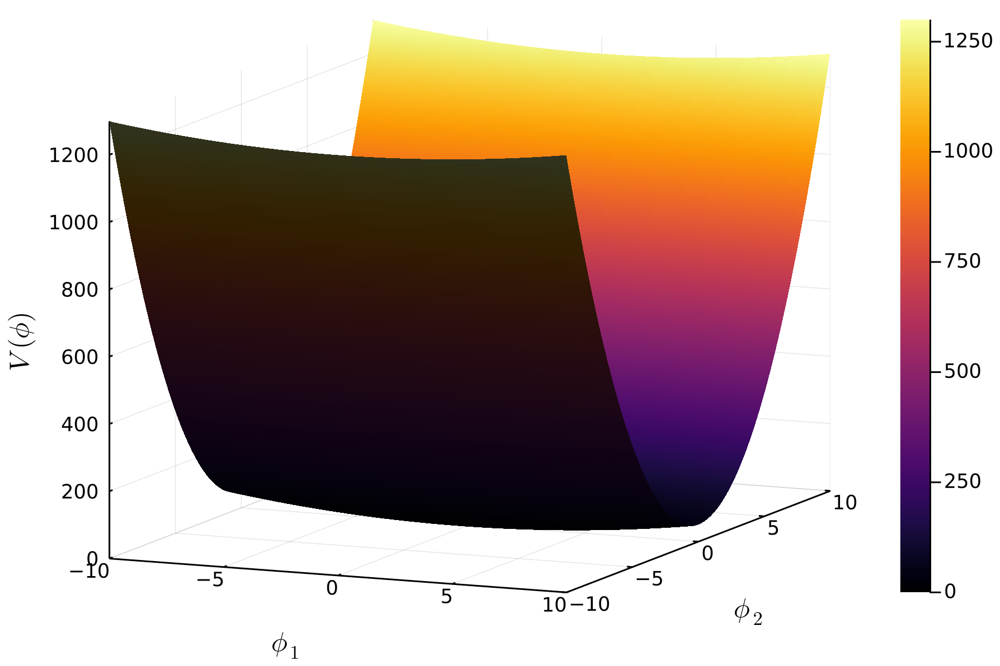

In [14]:
plotV(MyModel)[1]

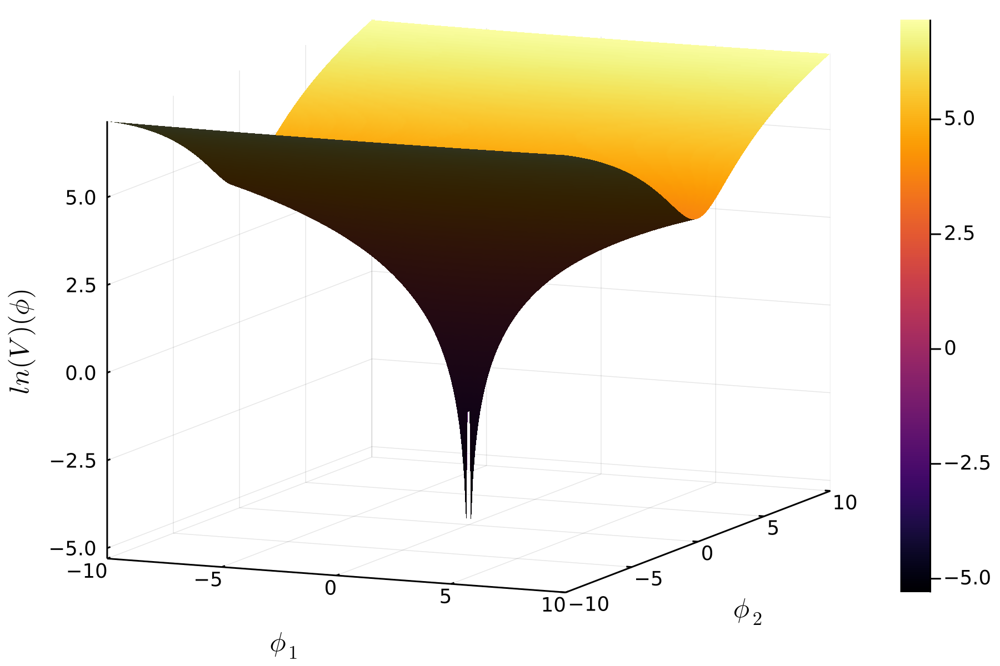

In [15]:
plotV(MyModel)[2]

In [16]:
ODE(MyModel::Model) = function f(dζ, ζ, p, N)
	ϕ, ξ = ζ[1:Int(length(ζ)/2)], ζ[Int(length(ζ)/2) + 1:end]
	ϵ = 0.5*norm(MyModel.Metric, ξ)(ϕ)^2
	
	@tensor dξ[a] := - inv(G(MyModel.Metric)(ϕ))[a, d] * Christoffel(MyModel.Metric)(ϕ)[d, b, c] * ξ[b] * ξ[c]
	dξ += (ϵ - 3)*(ξ + inv(G(MyModel.Metric)(ϕ))*gradient(ϕ -> log(V(MyModel.Potential)(ϕ)), ϕ))

	dζ[1] = ξ[1]
	dζ[2] = ξ[2]
	dζ[3] = dξ[1]
	dζ[4] = dξ[2]
end;

In [17]:
abstract type InitialConditions end
	
struct SlowRoll <: InitialConditions
    ϕ₀::Array
end

initial(SR::SlowRoll, MyModel::Model) = vcat(SR.ϕ₀, -inv(G(MyModel.Metric)(SR.ϕ₀))*gradient(ϕ -> log(V(MyModel.Potential)(ϕ)), SR.ϕ₀))

struct HyperInflation2D <: InitialConditions
    ϕ₀::Array
end

function initial(HI::HyperInflation2D, MyModel::Model)
    @assert typeof(MyModel.Metric) == Hyperbolic2D "Field space metric has to be Hyperbolic2D"

    L = MyModel.Metric.L
    
    ξ₁₀ = -3L
    ξ₂₀(ϵ) = 1/(L*sinh(HI.ϕ₀[1]/L))*sqrt( (3-ϵ)*gradient(ϕ -> log(V(MyModel.Potential)(ϕ)), HI.ϕ₀)[1] - 9L^2)
    
    to_root(ϵ) = norm(MyModel.Metric, [ξ₁₀, ξ₂₀(ϵ)])(HI.ϕ₀) - 2ϵ
    ϵ₀ = find_zero(to_root, 1e-5)
    
    vcat(HI.ϕ₀, [ξ₁₀, ξ₂₀(ϵ₀)])
end

initial (generic function with 2 methods)

In [18]:
ϕ₀ = [11., 11.]
ζ₀ = initial(SlowRoll(ϕ₀), MyModel)
# ζ₀ = initial(HyperInflation2D(ϕ₀), MyModel)
Nmin, Nmax = 0., 1000.
Ns = (Nmin, Nmax)

(0.0, 1000.0)

In [19]:
condition_terminate(MyModel::Model) = function condition_terminate(ζ, N, integrator)		
    ϕ, ξ = ζ[1:Int(length(ζ)/2)], ζ[Int(length(ζ)/2) + 1:end]
    ϵ = 0.5*norm(MyModel.Metric, ξ)(ϕ)^2
    1 - ϵ
end

affect!(integrator) = terminate!(integrator)
end_cb(MyModel::Model) = ContinuousCallback(condition_terminate(MyModel), affect!)

end_cb (generic function with 1 method)

In [20]:
problem(MyModel::Model, IC::Vector, Ns::Tuple, abstol = 1e-8, reltol = 1e-8) = ODEProblem(ODE(MyModel), IC, Ns, callback = end_cb(MyModel), abstol = abstol, reltol = reltol);

In [21]:
solution = solve(problem(MyModel, ζ₀, Ns, 1e-300), Tsit5())

retcode: Terminated
Interpolation: specialized 4th order "free" interpolation
t: 894-element Vector{Float64}:
  0.0
  0.018120975080012727
  0.045976934981325046
  0.07817728659885617
  0.11841998886905386
  0.16428626882353795
  0.21690524789527849
  0.27520422982968645
  0.33940208414588857
  0.4090297122177023
  ⋮
 61.44042828642069
 61.44847079458768
 61.456675353877486
 61.46501981883024
 61.47346327991297
 61.481961877012125
 61.49046644012126
 61.49178261497618
 61.49178261497618
u: 894-element Vector{Vector{Float64}}:
 [11.0, 11.0, -0.006993006993006993, -0.17482517482517482]
 [10.999873279282214, 10.996831989847422, -0.006993107920598636, -0.17482641365508078]
 [10.999678473170444, 10.991961954004505, -0.006993639504758261, -0.17483293732460786]
 [10.999453258597075, 10.986332064319642, -0.00699478070525148, -0.1748469386644708]
 [10.999171729078878, 10.97929525253463, -0.006996927152915672, -0.17487326470512854]
 [10.99885073333342, 10.971273574732935, -0.007000243513257974, 

In [22]:
function plotsol!(MyModel::Model, solution::ODESolution, legend=false, label=missing)
	if typeof(MyModel.Metric) == Hyperbolic2D
		
		return plot!(solution, vars = (2, 1), legend=legend, label=label, dpi = 300, proj=:polar, xlabel = latexify(MyModel.fields[1]), ylabel=latexify(MyModel.fields[2]), lims=(0,0.5), yguidefontsize=8, title="Trajectory in the ("*latexify(MyModel.fields[1])*", "*latexify(MyModel.fields[2])*") plane")
	end

	return plot!(solution, vars = (1,2), legend=legend, label=label, arrow=true, dpi = 300, xlabel = latexify(MyModel.fields[1]), ylabel=latexify(MyModel.fields[2]))
end;

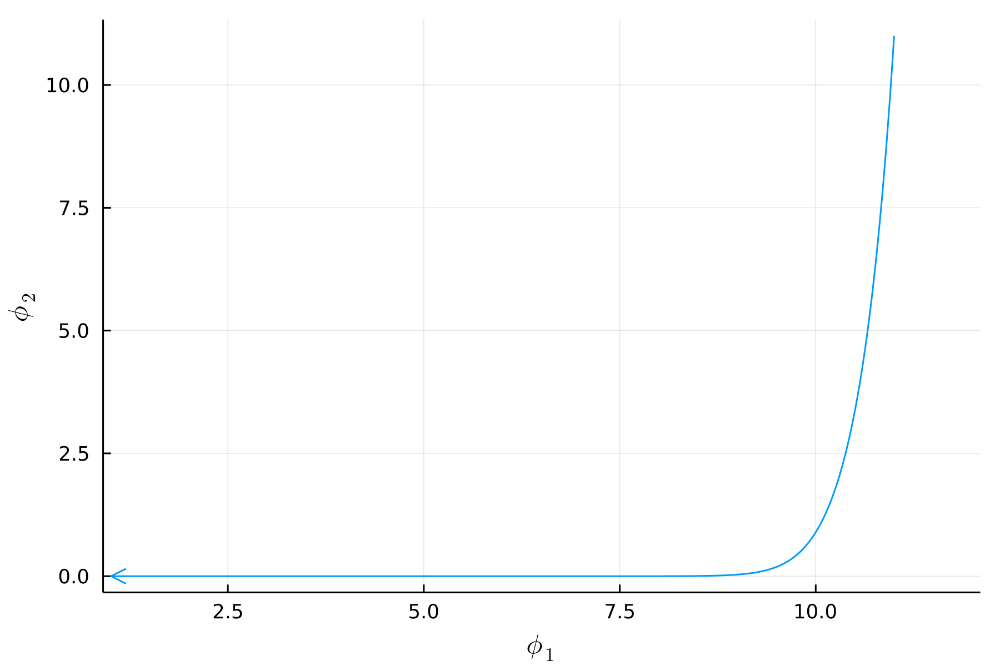

In [23]:
plot()
plotsol!(MyModel, solution)

In [24]:
Nend = solution.t[end]

61.49178261497618

In [25]:
ϵ(MyModel::Model, sol::ODESolution) = function(N::Real)
    0.5*norm(MyModel.Metric, sol(N)[Int(length(sol(N))/2) + 1:end])(sol(N)[Int(length(sol(N))/2) + 1:end])^2
end
v(MyModel::Model, sol::ODESolution) = function(N::Real) sqrt(2ϵ(MyModel, sol)(N)) end

η(MyModel::Model, sol::ODESolution) = function(N::Real)
    ζ, dζ = sol(N), derivative(N -> sol(N), N)
    ϕ, ξ = ζ[1:Int(length(ζ)/2)], ζ[Int(length(ζ)/2) + 1:end]
    @tensor covariant[a] := inv(G(MyModel.Metric)(ϕ))[a, d] * Christoffel(MyModel.Metric)(ϕ)[d, b, c] * ξ[b] * ξ[c]
    dζ[Int(length(dζ)/2) + 1:end] + covariant
end

ησ(MyModel::Model, sol::ODESolution) = function(N::Real)
    ζ, dζ = sol(N), derivative(N -> sol(N), N)
    ϕ, ξ = ζ[1:Int(length(ζ)/2)], ζ[Int(length(ζ)/2) + 1:end]
    dot(MyModel.Metric, η(MyModel, sol)(N), ξ)(ϕ)/norm(MyModel.Metric, ξ)(ϕ)
end

ηs(MyModel::Model, sol::ODESolution) = function(N::Real)
    ζ, dζ = sol(N), derivative(N -> sol(N), N)
    ϕ, ξ = ζ[1:Int(length(ζ)/2)], ζ[Int(length(ζ)/2) + 1:end]
    eσ = ξ/norm(MyModel.Metric, ξ)(ϕ)
    
    es = (Matrix{Float64}(I, length(ϕ), length(ϕ)) - eσ*eσ')*η(MyModel, sol)(N)
    norm(MyModel.Metric, ξ)(ϕ) == 0 ? perp_to(MyModel.Metric, eσ)(ϕ) : es /= norm(MyModel.Metric, ξ)(ϕ)

    dot(MyModel.Metric, η(MyModel, sol)(N), es)(ϕ)
end

ηs (generic function with 1 method)

In [26]:
function plotϵ!(MyModel::Model, solution::ODESolution, legend=false, label=missing)
    Nend = solution.t[end]
    plot!(Nmin:0.01:Nend, ϵ(MyModel, solution), legend=legend, label=label, xlabel=latexify("N"), ylabel=latexify("ϵ"))
end

function plotησ!(MyModel::Model, solution::ODESolution, legend=false, label=missing)
    Nend = solution.t[end]
    pησ = plot!(Nmin:0.1:Nend, N -> ησ(MyModel, solution)(N)/v(MyModel, solution)(N), legend=legend, label=label, xlabel=latexify("N"), ylabel=latexify("η_σ/v"))
end

function plotηs!(MyModel::Model, solution::ODESolution, legend=false, label=missing)
    Nend = solution.t[end]
    pηs = plot!(Nmin:0.1:Nend, N -> ηs(MyModel, solution)(N)/v(MyModel, solution)(N), legend=legend, label=label, xlabel=latexify("N"), ylabel=latexify("η_s/v"))
end

plotηs! (generic function with 3 methods)

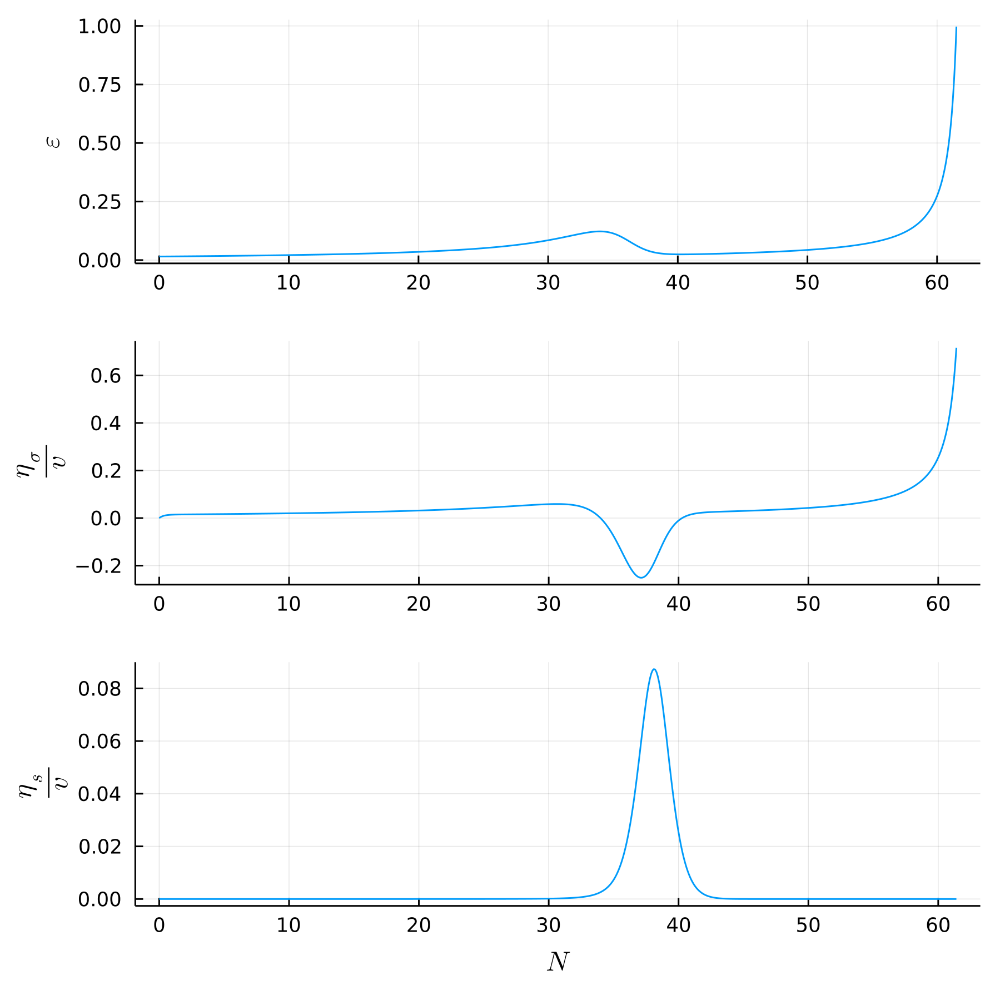

In [27]:
plot()
pϵ = plotϵ!(MyModel, solution)
xlabel!("")
plot()
pησ = plotησ!(MyModel, solution)
xlabel!("")
plot()
pηs = plotηs!(MyModel, solution)
plot(pϵ, pησ, pηs, layout=(3,1), size=(600,600), dpi=300)

In [28]:
modeltag = "HI"
# pname, prange = :m, 1:1:10
pname, prange = :L, 0.03:0.01:0.1
Vt(p::Real) = Quadratic((0.01, 0))
Gt(p::Real) = Hyperbolic2D(p)
# Gt(p::Real) = Canonical()

MyMdl(p::Real) = Model(nfields = nfields, input_field_names = (:ϕ, :χ), Potential = Vt(p), Metric = Gt(p))

ϕ₀p = [10., 1.]
# initialpt = SlowRoll(ϕ₀p)
initialpt = HyperInflation2D(ϕ₀p)
init(p::Real) = initial(initialpt, MyMdl(p))

init (generic function with 1 method)

In [29]:
Models, initials, problems, solutions = [], [], [], []
for p in prange
    push!(Models, MyMdl(p))

    push!(initials, initial(initialpt, MyMdl(p)))

    push!(problems, problem(MyMdl(p), initial(initialpt, MyMdl(p)), Ns, 1e-300))
    push!(solutions, solve(problem(MyMdl(p), initial(initialpt, MyMdl(p)), Ns, 1e-300), Tsit5()))
end

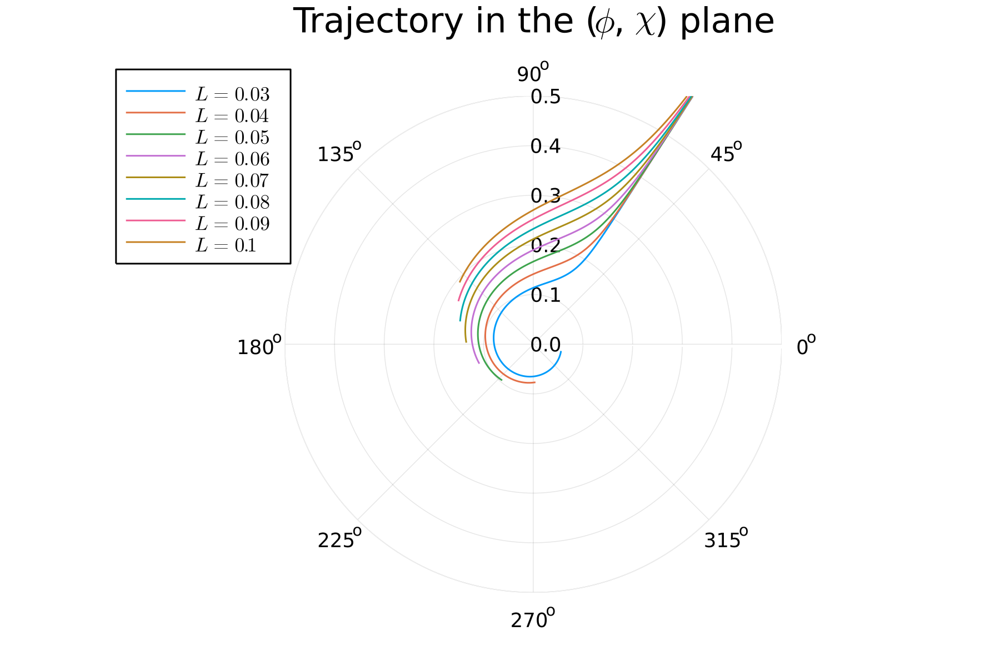

In [30]:
ptrajs = plot(dpi=300)
for (n, p) in enumerate(prange)
    plotsol!(MyMdl(p), solutions[n], :topleft, latexify(string(pname)*" = $p"))
end
plot!()
xlabel!(latexify(MyModel.fields[1]))
ylabel!(latexify(MyModel.fields[2]))

# savefig(ptrajs, "output/"*modeltag*"_trajs")
plot!()

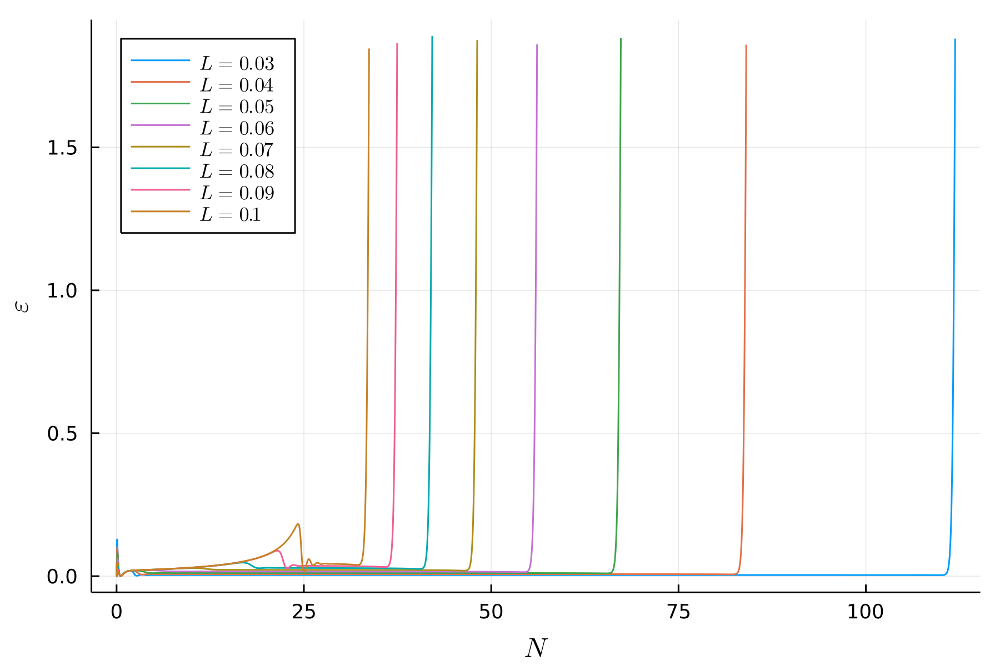

In [31]:
pϵp = plot(dpi=300)
for (n, p) in enumerate(prange)
    plotϵ!(MyMdl(p), solutions[n], :topleft, latexify(string(pname)*" = $p"))
end
plot!()

# savefig(pϵp, "output/"*modeltag*"_epsilon")
plot!()

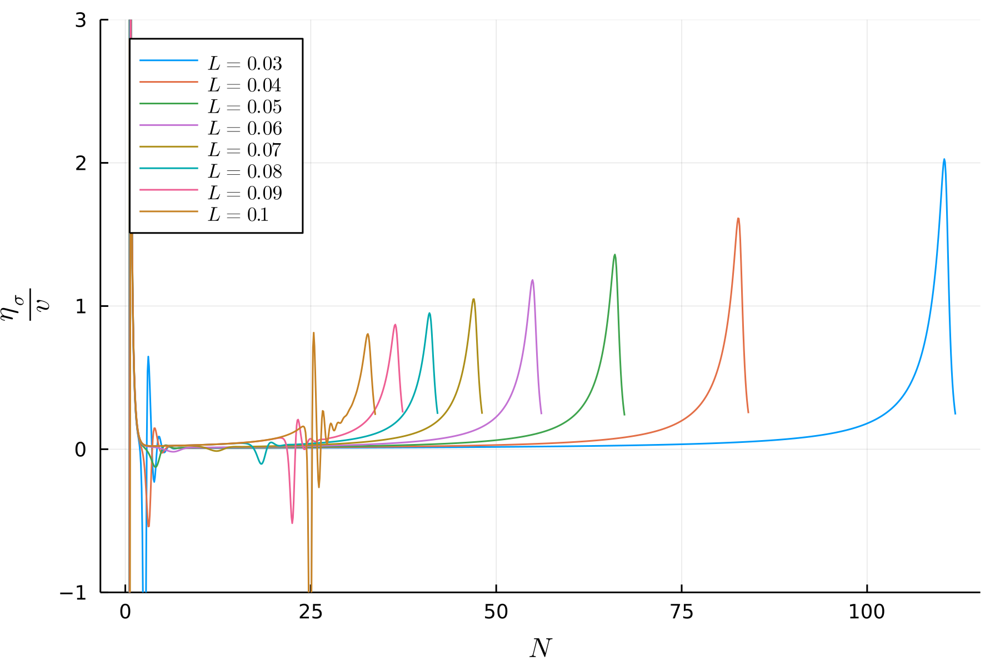

In [40]:
pησp = plot(dpi=300)
for (n, p) in enumerate(prange)
    plotησ!(MyMdl(p), solutions[n], :topleft, latexify(string(pname)*" = $p"))
end
plot!()
ylims!(-1, 3)

savefig(pησp, "output/"*modeltag*"_etapar")
plot!()

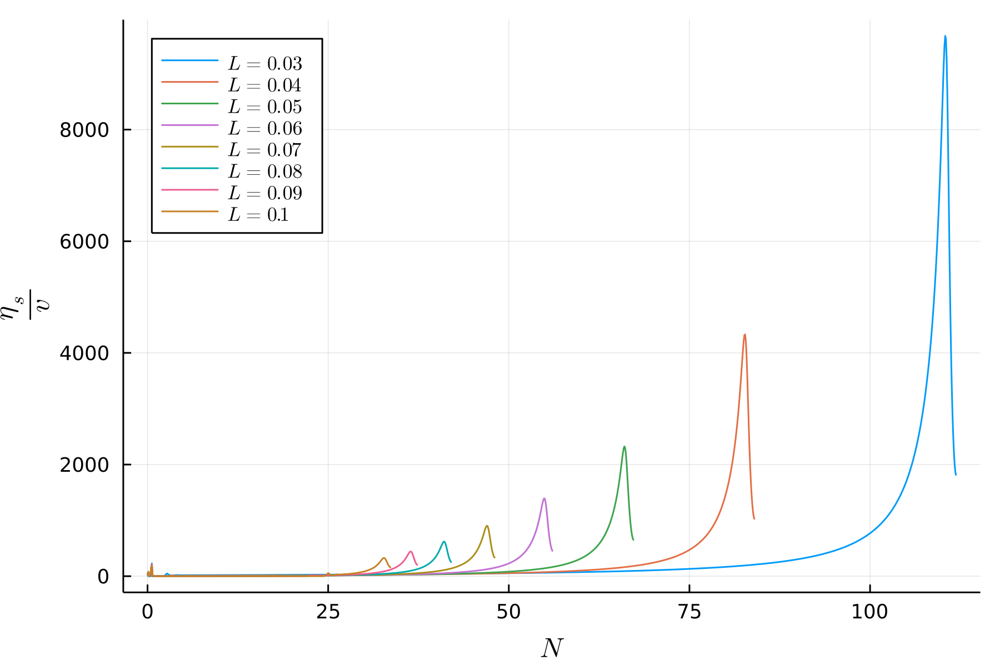

In [36]:
pησs = plot(dpi=300)
for (n, p) in enumerate(prange)
    plotηs!(MyMdl(p), solutions[n], :topleft, latexify(string(pname)*" = $p"))
end
plot!()

# savefig(pησs, "output/"*modeltag*"_etaperp")
plot!()